<h4>Data:</h4>
<ul>
    <li>Human Development Data from 1990 to 2017</li>
    <li>External dept of countries</li>
</ul>

<h4>Source:</h4> 
<ul>
    <li>http://hdr.undp.org/en/data</li>
    <li>http://datatopics.worldbank.org/debt/qeds</li>
</ul>

<h4>Hypotheses:</h4>
<ol>
<li>h0: There is no correlation between foreign investments and research and development expenses in a country.<br>
h1: There is a positive correlation between foreign investments and research and development expenses.</li>

<li>h0: There is no correlation between foreign investments and external dept of the country. <br>
h1: There is a positive correlation between foreign investments and external dept of the country.</li>
    <li>h0: There is no correlation between deforestation and people's health conditions in a country. <br>
    h1: There is a positive correlation between deforestation and health among citizens.</li>  
    <li>h0: There is no correlation between migration rate and unemployment or inequality in income in a country. <br>
    h1: The migration rate positively correlates with a lack of unemployment and inequality in income.</li>
</ol>

In [1]:
import time
import pandas as pd
import matplotlib.pyplot as plt 
import missingno as msno
import altair as alt
alt.data_transformers.disable_max_rows()
import seaborn as sns

In [2]:
#!conda install altair

In [3]:
!conda env list

# conda environments:
#
base                     /Users/Dima/anaconda3
ds601wk4                 /Users/Dima/anaconda3/envs/ds601wk4
ds601wk5                 /Users/Dima/anaconda3/envs/ds601wk5
project1                 /Users/Dima/anaconda3/envs/project1
project3              *  /Users/Dima/anaconda3/envs/project3



In [4]:
start_time = time.time()
df = pd.read_excel('2018_all_indicators.xlsx', sheet_name='Data')
print(time.time() - start_time,'seconds.')

7.773821115493774 seconds.


## Exploratory analysis of dataset

In [5]:
print('The dataset has ' + str(df.shape[0]) + ' rows and ' + str(df.shape[1]) + ' columns.')

The dataset has 25636 rows and 34 columns.


In [6]:
print(df.columns.values)

['dimension' 'indicator_id' 'indicator_name' 'iso3' 'country_name' 1990
 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 9999]


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25636 entries, 0 to 25635
Data columns (total 34 columns):
dimension         25636 non-null object
indicator_id      25636 non-null int64
indicator_name    25636 non-null object
iso3              25636 non-null object
country_name      25636 non-null object
1990              10073 non-null float64
1991              7454 non-null float64
1992              5740 non-null float64
1993              5986 non-null float64
1994              5808 non-null float64
1995              13849 non-null float64
1996              6217 non-null float64
1997              6347 non-null float64
1998              6384 non-null float64
1999              6462 non-null float64
2000              16612 non-null float64
2001              7556 non-null float64
2002              7582 non-null float64
2003              7627 non-null float64
2004              7708 non-null float64
2005              17048 non-null float64
2006              12885 non-null float64
2007   

data uses only 6,7 MB of memory which is fine.

Column "9999" contains information for several years and I don't know how it can be used in my case so it needs to be dropped. I will do it after exploraton of the data.

In [8]:
df.head()

,dimension,indicator_id,indicator_name,iso3,country_name,1990,1991,1992,1993,1994,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,9999
0,Composite indices,146206,HDI rank,AFG,Afghanistan,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,168.0,168.0,NaN
1,Composite indices,146206,HDI rank,ALB,Albania,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,69.0,68.0,NaN
2,Composite indices,146206,HDI rank,DZA,Algeria,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,83.0,85.0,NaN
3,Composite indices,146206,HDI rank,AND,Andorra,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.0,35.0,NaN
4,Composite indices,146206,HDI rank,AGO,Angola,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,145.0,147.0,NaN


In [9]:
df.tail()

,dimension,indicator_id,indicator_name,iso3,country_name,1990,1991,1992,1993,1994,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,9999
25631,"Work, employment and vulnerability",147906,Youth not in school or employment (% ages 15-24),VEN,Venezuela (Bolivarian Republic of),NaN,NaN,NaN,NaN,NaN,...,18.4,19.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25632,"Work, employment and vulnerability",147906,Youth not in school or employment (% ages 15-24),VNM,Viet Nam,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,9.4,10.0,9.7,0.6,0.6,NaN,0.6
25633,"Work, employment and vulnerability",147906,Youth not in school or employment (% ages 15-24),YEM,Yemen,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,44.8,NaN,NaN,NaN,44.8
25634,"Work, employment and vulnerability",147906,Youth not in school or employment (% ages 15-24),ZMB,Zambia,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25635,"Work, employment and vulnerability",147906,Youth not in school or employment (% ages 15-24),ZWE,Zimbabwe,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,17.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
df.sample(5)

,dimension,indicator_id,indicator_name,iso3,country_name,1990,1991,1992,1993,1994,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,9999
14801,Human Security,21806,Refugees by country of origin (thousands),NAM,Namibia,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.4,NaN
21813,Socio-economic sustainability,177106,Population using improved drinking-water sourc...,USA,United States,NaN,NaN,NaN,NaN,NaN,...,NaN,99.2,NaN,NaN,NaN,NaN,99.2,NaN,NaN,99.2
6601,Environmental sustainability,164206,"Forest area, change (%)",SAU,Saudi Arabia,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
5825,Education,177706,Survival rate to the last grade of lower secon...,NPL,Nepal,NaN,NaN,NaN,NaN,NaN,...,NaN,92.0,94.0,88.0,91.0,92.0,94.0,95.0,NaN,95.0
455,Demography,47906,Median age (years),IRN,Iran (Islamic Republic of),17.2,NaN,NaN,NaN,NaN,...,NaN,26.9,NaN,NaN,NaN,NaN,29.5,NaN,NaN,29.5


Data organised on a row basis, it doesn't provide indicators in columns. All indicators are given in rows one after another. I will need to separate indicators and then look at them more closely.

In [11]:
df.dtypes

dimension          object
indicator_id        int64
indicator_name     object
iso3               object
country_name       object
1990              float64
1991              float64
1992              float64
1993              float64
1994              float64
1995              float64
1996              float64
1997              float64
1998              float64
1999              float64
2000              float64
2001              float64
2002              float64
2003              float64
2004              float64
2005              float64
2006              float64
2007              float64
2008              float64
2009              float64
2010              float64
2011              float64
2012              float64
2013              float64
2014              float64
2015              float64
2016              float64
2017              float64
9999              float64
dtype: object

Most of the data columns are numeric which makes it easier for me to work over the hypotheses and calculate correlations. But each year holds a column. I am going to put every year to one column so I could plot it easily.

In [12]:
df.describe()

,indicator_id,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,9999
count,25636.000000,10073.000000,7454.000000,5740.000000,5986.000000,5808.000000,13849.000000,6217.000000,6347.000000,6384.000000,...,13164.000000,18653.000000,17555.000000,17401.000000,17436.000000,17644.000000,18381.000000,16277.000000,12728.000000,23606.000000
mean,112691.044469,470.923945,359.098828,450.229147,455.078856,466.029477,709.634434,549.363111,613.642685,616.602630,...,792.250016,728.724143,783.215285,803.458199,819.998917,840.371584,805.788142,978.465636,1080.966623,759.226948
std,50159.709285,3639.902328,3177.231668,3675.653060,3703.687824,3800.754372,4853.755116,4058.184005,4442.899386,4486.472899,...,5271.961828,5030.841400,5239.874586,5287.062697,5384.746402,5453.146215,5327.939333,7061.334807,6376.774963,6127.232840
min,21806.000000,-59.400000,-37.300000,-40.600000,-33.400000,-22.600000,-115.200000,-161.800000,-28.200000,-83.800000,...,-79.700000,-165.500000,-249.700000,-759.800000,-421.600000,-120.200000,-218.600000,-198.200000,-30.500000,-198.200000
25%,63406.000000,2.600000,1.600000,1.100000,0.940000,1.200000,1.500000,1.300000,1.700000,1.600000,...,2.800000,1.700000,1.900000,1.800000,1.700000,1.800000,2.000000,1.300000,1.050000,2.700000
50%,121106.000000,19.800000,12.300000,10.900000,10.000000,10.700000,17.100000,10.800000,11.000000,11.000000,...,18.100000,15.800000,16.100000,15.800000,16.000000,16.565000,17.800000,17.100000,14.600000,20.000000
75%,153706.000000,67.200000,56.300000,61.200000,58.900000,61.625000,64.700000,63.400000,63.200000,63.000000,...,69.700000,63.400000,65.250000,64.300000,65.100000,64.825000,68.100000,66.000000,59.800000,68.600000
max,183406.000000,110432.000000,95458.000000,92326.000000,91853.000000,96179.000000,138122.000000,101093.000000,103349.000000,105063.000000,...,130828.000000,136890.000000,141200.000000,137537.000000,135959.000000,134958.000000,137382.000000,364225.000000,135961.000000,364225.000000


These are overall indicators and don't make much sense for now so I will need to distinguish specific categories.

## Data Cleaning

At first let check for missing values.

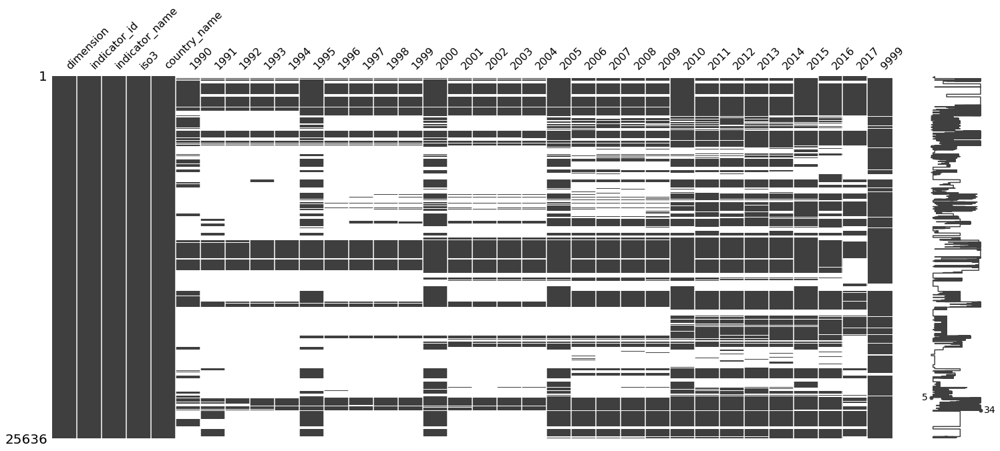

In [13]:
msno.matrix(df);

There are many missing values overall but I don't think that deleting columns based on this plot is a good idea because this way I can delete valuable data for some countries.

In [14]:
df.isnull().sum()

dimension             0
indicator_id          0
indicator_name        0
iso3                  0
country_name          0
1990              15563
1991              18182
1992              19896
1993              19650
1994              19828
1995              11787
1996              19419
1997              19289
1998              19252
1999              19174
2000               9024
2001              18080
2002              18054
2003              18009
2004              17928
2005               8588
2006              12751
2007              12711
2008              12780
2009              12472
2010               6983
2011               8081
2012               8235
2013               8200
2014               7992
2015               7255
2016               9359
2017              12908
9999               2030
dtype: int64

Let's see what it in the last column

In [15]:
df[9999].value_counts()

 100.0      394
 0.0        252
 0.1        171
 1.0        167
 2.0        111
           ... 
 1260.0       1
 4232.0       1
-25.2         1
 18975.0      1
-11.2         1
Name: 9999, Length: 3805, dtype: int64

It contains data but I will drop it anyway.

In [16]:
df = df.drop([9999], axis=1)

Data has wide range of columns containing years which makes it difficult to plot everything together. I will melt it into the one column. I will have 2 columns Year and Value for that year.

In [17]:
#https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.melt.html
df = df.melt(id_vars=["dimension", "indicator_id", "indicator_name", "iso3", "country_name"], 
        var_name="Year", 
        value_name="Value")

In [18]:
df.sample(10)

,dimension,indicator_id,indicator_name,iso3,country_name,Year,Value
243345,Health,121106,"Life expectancy at birth, male (years)",FSM,Micronesia (Federated States of),1999,66.600
143563,Income/composition of resources,127606,Domestic credit provided by financial sector (...,SRB,Serbia,1995,NaN
400895,Inequality,135006,Coefficient of human inequality,AFG,Afghanistan,2005,NaN
357329,"Work, employment and vulnerability",150706,Employment in services (% of total employment),URY,Uruguay,2003,NaN
625559,Gender,31706,Share of seats in parliament (% held by women),AGO,Angola,2014,36.800
106549,Education,103006,Mean years of schooling (years),MHL,Marshall Islands,1994,NaN
716744,"Work, employment and vulnerability",48706,Labour force participation rate (% ages 15 and...,SVK,Slovakia,2017,52.500
103975,Demography,49006,Sex ratio at birth (male to female births),PNG,Papua New Guinea,1994,NaN
77187,Composite indices,137506,Human Development Index (HDI),KOR,Korea (Republic of),1993,0.756
578791,Human Security,21806,Refugees by country of origin (thousands),MOZ,Mozambique,2012,NaN


Data is multilayered, has dimensions and indicators within each dimension.

In [19]:
df['dimension'].value_counts()

Education                             107044
Gender                                 99820
Health                                 74144
Inequality                             56392
Work, employment and vulnerability     55972
Socio-economic sustainability          53256
Environmental sustainability           51660
Demography                             47180
Poverty                                41216
Human Security                         36288
Income/composition of resources        31220
Mobility and communication             28000
Trade and financial flows              25032
Composite indices                      10584
Name: dimension, dtype: int64

Example of indicators for the Education dimention

In [20]:
df[df['dimension'] == 'Education']['indicator_name'].value_counts()

Expected years of schooling (years)                                                5404
Pupil-teacher ratio, primary school (pupils per teacher)                           5376
Gross enrolment ratio, primary (% of primary school-age population)                5348
Gross enrolment ratio, secondary (% of secondary school-age population)            5348
Mean years of schooling (years)                                                    5320
Expected years of schooling, male (years)                                          5292
Expected years of schooling, female (years)                                        5292
Education index                                                                    5292
Gross enrolment ratio, pre-primary (% of preschool-age children)                   5264
Gross enrolment ratio, tertiary (% of tertiary school-age population)              5152
Government expenditure on education (% of GDP)                                     4984
Primary school dropout rate (% o

Now I understand how the data organized and look like, it doesn't need any further cleanup which means I can start exploring the first hypothesis.

## Hypothesis 1
<p>h0: There is no correlation between foreign investments and research and development expenses in a country. </p>
<p>h1: There is a positive correlation between foreign investments and research and development expenses.</p>

Data is multidimensional so I need to find right indicator and save it for later use

In [21]:
df[df['dimension'] == 'Trade and financial flows']['indicator_name'].value_counts()

Foreign direct investment, net inflows (% of GDP)          5292
Exports and imports (% of GDP)                             5208
Remittances, inflows (% of GDP)                            5096
Private capital flows (% of GDP)                           5068
Net official development assistance received (% of GNI)    4368
Name: indicator_name, dtype: int64

In [22]:
Foreign_investment = df[df['indicator_name'] == 'Foreign direct investment, net inflows (% of GDP)']

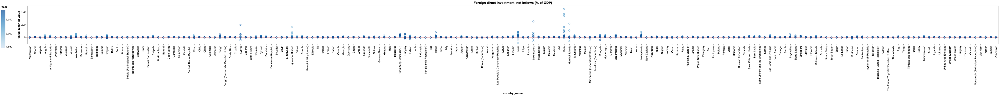

In [23]:
point = alt.Chart(Foreign_investment, title="Foreign direct investment, net inflows (% of GDP)").mark_point().encode(
    x='country_name',
    y='Value',
    color=alt.Color('Year', legend=alt.Legend(orient="left")),
    tooltip=['Value', 'Year', 'country_name']
)
rule = alt.Chart(Foreign_investment).mark_rule(color='red').encode(
    y='mean(Value)'
)

(point + rule).properties(height=150)

For later calculation based on an average value I save countries with value higher than a average

In [24]:
Foreign_investment_mean = Foreign_investment[Foreign_investment['Value'] > Foreign_investment['Value'].mean()]

In [25]:
Foreign_investment.describe()

,indicator_id,Value
count,5292.0,4853.000000
mean,53506.0,4.815434
std,0.0,14.127008
min,53506.0,-82.900000
25%,53506.0,0.800000
50%,53506.0,2.400000
75%,53506.0,5.400000
max,53506.0,451.700000


Now we can see how the distribution for countries above the average line is different.

In [26]:
Foreign_investment_mean.describe()

,indicator_id,Value
count,1346.0,1346.000000
mean,53506.0,13.569019
std,0.0,24.265689
min,53506.0,4.900000
25%,53506.0,6.200000
50%,53506.0,8.400000
75%,53506.0,12.575000
max,53506.0,451.700000


Now I am looking for the Research and development indicator which I am going to compare with the Foreign investment.

In [27]:
df[df['dimension'] == 'Socio-economic sustainability']['indicator_name'].value_counts()

Population using improved sanitation facilities (%)                        5460
Population using improved drinking-water sources (%)                       5460
Rural population with access to electricity (%)                            5376
Concentration index (exports) (value)                                      5348
Gross capital formation (% of GDP)                                         4956
Adjusted net savings (% of GNI)                                            4536
Skilled labour force (% of labour force)                                   3976
Ratio of education and health expenditure to military expenditure          3976
Overall loss in HDI value due to inequality, average annual change (%)     3696
Research and development expenditure (% of GDP)                            3584
Income quintile ratio, average annual change (%)                           3472
Total debt service (% of exports of goods, services and primary income)    3416
Name: indicator_name, dtype: int64

In [28]:
Research_expences =  df[df['indicator_name'] == 'Research and development expenditure (% of GDP)']

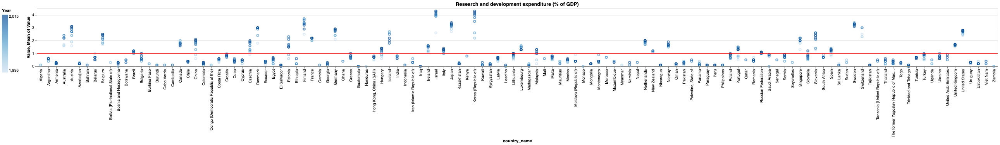

In [29]:
point = alt.Chart(Research_expences, title="Research and development expenditure (% of GDP)").mark_point().encode(
    x='country_name',
    y='Value',
    color=alt.Color('Year', legend=alt.Legend(orient="left")),
    tooltip=['Value', 'Year', 'country_name']
)
rule = alt.Chart(Research_expences).mark_rule(color='red').encode(
    y='mean(Value)'
)

(point + rule).properties(height=150)

In [30]:
Research_expences.describe()

,indicator_id,Value
count,3584.0,711.000000
mean,52306.0,1.007314
std,0.0,0.967836
min,52306.0,0.000000
25%,52306.0,0.300000
50%,52306.0,0.700000
75%,52306.0,1.500000
max,52306.0,4.300000


The average Research Expenses are about 1% of GDP. For example, world average Military Expenditure in 2019 is 2.1% https://en.wikipedia.org/wiki/List_of_countries_by_military_expenditures

Joining two df Foreign_investment and Research_expences on iso3 column. 
Making sure that I have only 'Value', 'iso3' columns from Research_expences. 
Than dropping an unnecessary numeric column that can distract the correlation matrix

In [31]:
Investment_research = pd.merge(Foreign_investment, Research_expences[['Value', 'iso3']], on='iso3')
Investment_research = Investment_research.drop(['indicator_id'], axis=1)
Investment_research = Investment_research.rename(columns={"Value_x": "Value foreign investment", "Value_y": "Value research expences"})

In order to plot possible pairwise relationships in the dataset I will use pairplot

/Users/Dima/anaconda3/envs/project3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/Dima/anaconda3/envs/project3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


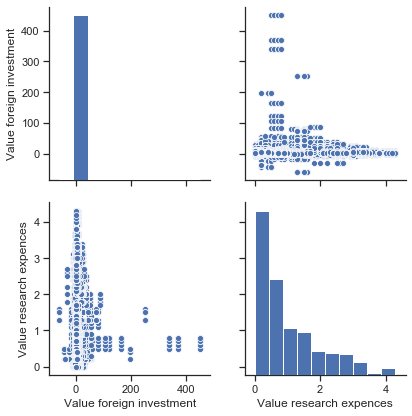

In [32]:
sns.set(style="ticks", color_codes=True);
select_columns = ['Value foreign investment', 'Value research expences']
sns.pairplot(Investment_research[select_columns], height=3);

There is no relationship I can see on this plot

In [33]:
Investment_research.corr()

,Value foreign investment,Value research expences
Value foreign investment,1.000000,-0.020118
Value research expences,-0.020118,1.000000


Correlation is negative

Same procedure for the Mean DF to see if the is a difference for countries with higher average foreign investments

In [34]:
Foreign_research_mean = pd.merge(Research_expences, Foreign_investment_mean[['Value', 'iso3']], on='iso3')
Foreign_research_mean = Foreign_research_mean.drop(['indicator_id'], axis=1)
Foreign_research_mean = Foreign_research_mean.rename(columns={"Value_x": "Value foreign investment", "Value_y": "Value research expences mean"})

In [35]:
Foreign_research_mean.sample(5)

,dimension,indicator_name,iso3,country_name,Year,Value foreign investment,Value research expences mean
3001,Socio-economic sustainability,Research and development expenditure (% of GDP),CPV,Cabo Verde,1993,NaN,7.0
23806,Socio-economic sustainability,Research and development expenditure (% of GDP),ZMB,Zambia,2009,NaN,5.6
21521,Socio-economic sustainability,Research and development expenditure (% of GDP),MKD,The former Yugoslav Republic of Macedonia,1992,NaN,6.2
4974,Socio-economic sustainability,Research and development expenditure (% of GDP),CRI,Costa Rica,1997,NaN,8.0
17888,Socio-economic sustainability,Research and development expenditure (% of GDP),PRT,Portugal,1994,NaN,6.2


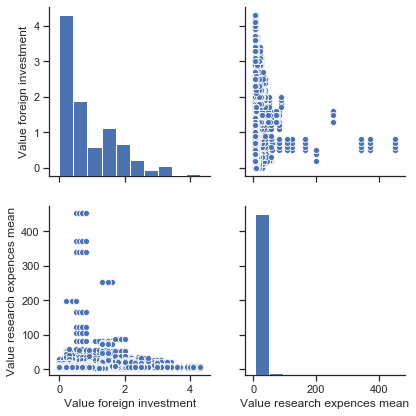

In [36]:
sns.set(style="ticks", color_codes=True);
select_columns = ['Value foreign investment', 'Value research expences mean']
sns.pairplot(Foreign_research_mean[select_columns], height=3);

In [37]:
Foreign_research_mean.corr()

,Value foreign investment,Value research expences mean
Value foreign investment,1.000000,0.021534
Value research expences mean,0.021534,1.000000


<h4>Conclusion: based on the data I have there is no correlation between foreign investments and research expences.</h4>

## Hypothesis 2
<p>h0: There is no correlation between foreign investments and external dept of the country. </p>
<p>h1: There is a positive correlation between foreign investments and external dept of the country.</p>

In [38]:
start_time = time.time()
dept_data = pd.read_csv('dept_data.csv')
print(time.time() - start_time,'seconds.')

0.011188983917236328 seconds.


In [39]:
dept_data.head()

,Series Name,Series Code,Country Name,Country Code,Scale (Precision),2017Q2 [YR2017Q2],2017Q3 [YR2017Q3],2017Q4 [YR2017Q4],2018Q1 [YR2018Q1],2018Q2 [YR2018Q2],2018Q3 [YR2018Q3],2018Q4 [YR2018Q4],2019Q1 [YR2019Q1],2019Q2 [YR2019Q2]
0,"Gross Ext. Debt Pos., All Sectors, All maturit...",DT.DOD.DECT.CD.AR.US,Argentina,ARG,Millions (0),204914.0,217510.0,234549.0,252896.0,261476.0,255490.0,277932.0,275748.0,283567.0
1,"Gross Ext. Debt Pos., All Sectors, All maturit...",DT.DOD.DECT.CD.AR.US,Armenia,ARM,Millions (0),9943.0,9900.0,10525.0,10797.0,10585.0,10843.0,10914.0,11082.0,11473.0
2,"Gross Ext. Debt Pos., All Sectors, All maturit...",DT.DOD.DECT.CD.AR.US,Australia,AUS,Millions (0),1492370.0,1518982.0,1550905.0,1565847.0,1533870.0,1494436.0,1498360.0,1503213.0,1484182.0
3,"Gross Ext. Debt Pos., All Sectors, All maturit...",DT.DOD.DECT.CD.AR.US,Austria,AUT,Millions (0),663755.0,687304.0,684674.0,711904.0,677854.0,673947.0,655604.0,670087.0,693685.0
4,"Gross Ext. Debt Pos., All Sectors, All maturit...",DT.DOD.DECT.CD.AR.US,Belarus,BLR,Millions (0),38975.0,39557.0,39929.0,39679.0,39062.0,39163.0,39289.0,38923.0,40071.0


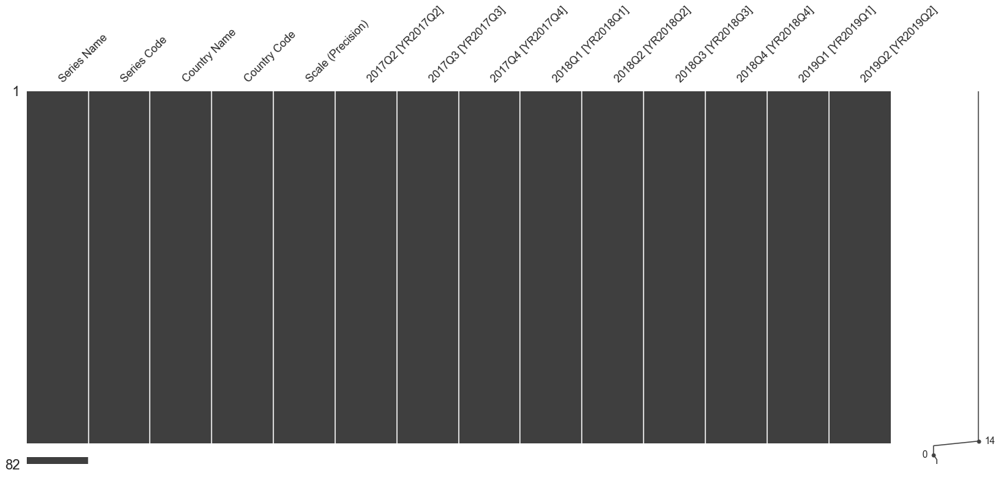

In [40]:
msno.matrix(dept_data);

In [41]:
dept_data.isna().sum()

Series Name          3
Series Code          5
Country Name         5
Country Code         5
Scale (Precision)    5
2017Q2 [YR2017Q2]    5
2017Q3 [YR2017Q3]    5
2017Q4 [YR2017Q4]    5
2018Q1 [YR2018Q1]    5
2018Q2 [YR2018Q2]    5
2018Q3 [YR2018Q3]    5
2018Q4 [YR2018Q4]    5
2019Q1 [YR2019Q1]    5
2019Q2 [YR2019Q2]    5
dtype: int64

There are 5 empty rows that can be dropped without any harm

In [42]:
dept_data = dept_data.dropna()

In order to join this data with the main dataset I need to have information for the year as a whole 

Combining quarter columns for a year into one column with the mean value from all of them

In [43]:
#https://stackoverflow.com/questions/34734940/row-wise-average-for-a-subset-of-columns-with-missing-values
dept_data['2017'] = dept_data[['2017Q2 [YR2017Q2]', '2017Q3 [YR2017Q3]', '2017Q4 [YR2017Q4]']].mean(axis = 1, skipna = True)
dept_data['2018'] = dept_data[['2018Q1 [YR2018Q1]', '2018Q2 [YR2018Q2]', '2018Q3 [YR2018Q3]', '2018Q4 [YR2018Q4]']].mean(axis = 1, skipna = True)
dept_data['2019'] = dept_data[['2019Q1 [YR2019Q1]', '2019Q2 [YR2019Q2]']].mean(axis = 1, skipna = True)

Leaving only necessary columns, dropping everything else

In [44]:
dept_data = dept_data[['Country Name', 'Country Code', '2017', '2018', '2019']]

In [45]:
dept_data.head()

,Country Name,Country Code,2017,2018,2019
0,Argentina,ARG,2.189910e+05,261948.50,279657.5
1,Armenia,ARM,1.012267e+04,10784.75,11277.5
2,Australia,AUS,1.520752e+06,1523128.25,1493697.5
3,Austria,AUT,6.785777e+05,679827.25,681886.0
4,Belarus,BLR,3.948700e+04,39298.25,39497.0


Renaming country code column into iso3 to join DFs based on this column

In [46]:
dept_data = dept_data.rename(columns={"Country Code": "iso3"}) 

Combining year columns into one

In [47]:
dept_data = dept_data.melt(id_vars=["Country Name", "iso3"], 
        var_name="Year", 
        value_name="Value")

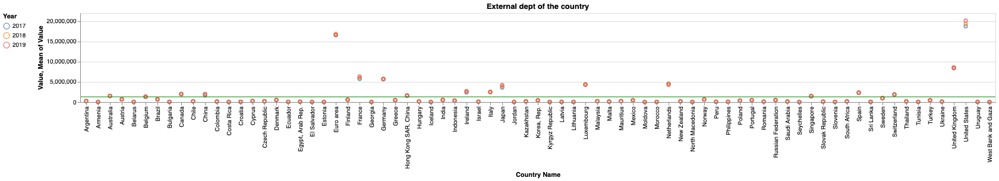

In [48]:
point = alt.Chart(dept_data, title="External dept of the country").mark_point().encode(
    x='Country Name',
    y='Value',
    color=alt.Color('Year', legend=alt.Legend(orient="left")),
    tooltip=['Value', 'Year', 'Country Name']
)
rule = alt.Chart(dept_data).mark_rule(color='green').encode(
    y='mean(Value)'
)

(point + rule).properties(height=150)

Joining main data set with dataset containing External dept information

In [49]:
Investment_dept = pd.merge(Foreign_investment, dept_data[['Value', 'iso3']], on='iso3')
Investment_dept = Investment_dept.drop(['indicator_id'], axis=1)
Investment_dept = Investment_dept.rename(columns={"Value_x": "Value foreign investment", "Value_y": "External dept of the country"})

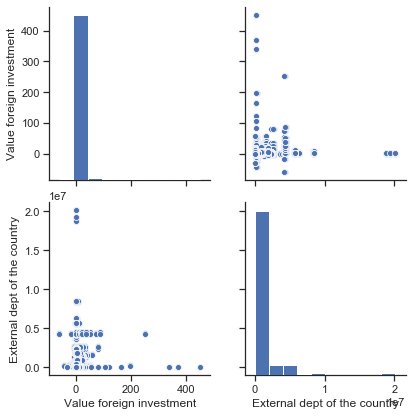

In [50]:
sns.set(style="ticks", color_codes=True);
select_columns = ['Value foreign investment', 'External dept of the country']
sns.pairplot(Investment_dept[select_columns], height=3);

In [51]:
Investment_dept.corr()

,Value foreign investment,External dept of the country
Value foreign investment,1.000000,0.000176
External dept of the country,0.000176,1.000000


<h4>Conclusion: based on the data there is no correlation between foreign investments and External dept of the country.</h4>

## Hypothesis 3
<p>h0: There is no correlation between deforestation and people's health conditions in a country.
 <br>
</p>
<p>h1: There is a positive correlation between deforestation and health among citizens.</p>

In order to check on the first hypothesis I am going to need to use two dimentions of the data: Health and Environmental sustainability

In [52]:
df[df['dimension'] == 'Health']['indicator_name'].value_counts()

Tuberculosis incidence (per 100,000 people)                          5432
Mortality rate, infant (per 1,000 live births)                       5404
Infants lacking immunization, DPT (% of one-year-olds)               5404
Mortality rate, under-five (per 1,000 live births)                   5404
Infants lacking immunization, measles (% of one-year-olds)           5404
Life expectancy at birth (years)                                     5376
Life expectancy index                                                5376
Current health expenditure (% of GDP)                                5292
Mortality rate, male adult (per 1,000 people)                        5264
Mortality rate, female adult (per 1,000 people)                      5264
Life expectancy at birth, female (years)                             5180
Life expectancy at birth, male (years)                               5180
HIV prevalence, adult (% ages 15-49)                                 3696
Child malnutrition, stunting (moderate

I have decided to use 5 indicators from this dimention

In [53]:
HIV = df[df['indicator_name'] == 'HIV prevalence, adult (% ages 15-49)']

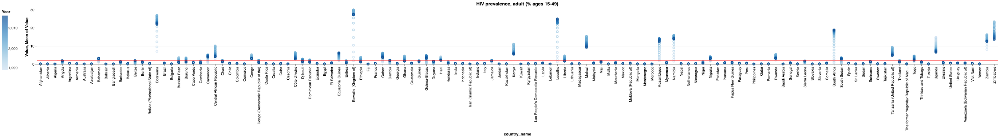

In [54]:
point = alt.Chart(HIV, title="HIV prevalence, adult (% ages 15-49)").mark_point().encode(
    x='country_name',
    y='Value',
    color=alt.Color('Year', legend=alt.Legend(orient="left")),
    tooltip=['Value', 'Year', 'country_name']
)
rule = alt.Chart(HIV).mark_rule(color='red').encode(
    y='mean(Value)'
)

(point + rule).properties(height=150)

Taking countries with higher than average rate of HIV 

In [55]:
HIVmean = HIV[HIV['Value'] > HIV['Value'].mean()]

In [56]:
LEB = df[df['indicator_name'] == 'Life expectancy at birth (years)']

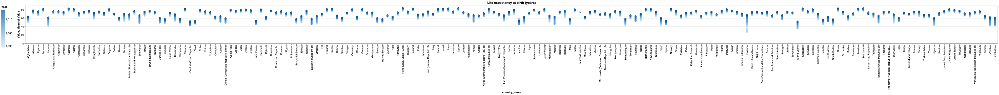

In [57]:
point = alt.Chart(LEB, title="Life expectancy at birth (years)").mark_point().encode(
    x='country_name',
    y='Value',
    color=alt.Color('Year', legend=alt.Legend(orient="left")),
    tooltip=['Value', 'Year', 'country_name']
)
rule = alt.Chart(LEB).mark_rule(color='red').encode(
    y='mean(Value)'
)

(point + rule).properties(height=150)

Taking countries with lower raiting of life expectancy based on the graph

In [58]:
LEBmean = LEB[LEB['Value'] < LEB['Value'].mean()]

In [59]:
MRF = df[df['indicator_name'] == 'Mortality rate, female adult (per 1,000 people)']

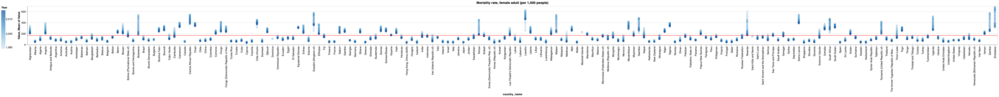

In [60]:
point = alt.Chart(MRF, title="Mortality rate, female adult (per 1,000 people)").mark_point().encode(
    x='country_name',
    y='Value',
    color=alt.Color('Year', legend=alt.Legend(orient="left")),
    tooltip=['Value', 'Year', 'country_name']
)
rule = alt.Chart(MRF).mark_rule(color='red').encode(
    y='mean(Value)'
)

(point + rule).properties(height=150)

Taking countries with higher raiting of mortality rate among women based on the graph

In [61]:
MRFmean = MRF[MRF['Value'] > MRF['Value'].mean()]

In [62]:
MRM = df[df['indicator_name'] == 'Mortality rate, male adult (per 1,000 people)']

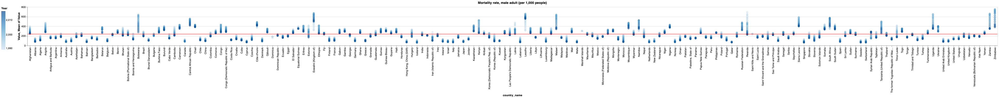

In [63]:
point = alt.Chart(MRM, title="Mortality rate, male adult (per 1,000 people)").mark_point().encode(
    x='country_name',
    y='Value',
    color=alt.Color('Year', legend=alt.Legend(orient="left")),
    tooltip=['Value', 'Year', 'country_name']
)
rule = alt.Chart(MRM).mark_rule(color='red').encode(
    y='mean(Value)'
)

(point + rule).properties(height=150)

Taking countries with higher raiting of mortality rate among men based on the graph

In [64]:
MRMmean = MRM[MRM['Value'] > MRM['Value'].mean()]

In [65]:
MRC = df[df['indicator_name'] == 'Mortality rate, under-five (per 1,000 live births)']

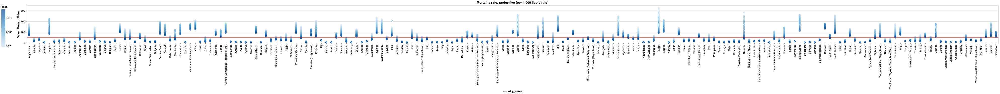

In [66]:
point = alt.Chart(MRC, title="Mortality rate, under-five (per 1,000 live births)").mark_point().encode(
    x='country_name',
    y='Value',
    color=alt.Color('Year', legend=alt.Legend(orient="left")),
    tooltip=['Value', 'Year', 'country_name']
)
rule = alt.Chart(MRC).mark_rule(color='red').encode(
    y='mean(Value)'
)

(point + rule).properties(height=150)

Taking countries with higher raiting of mortality rate among children based on the graph

In [67]:
MRCmean = MRC[MRC['Value'] > MRC['Value'].mean()]

Recieving environmental data

In [68]:
Forest_df = df[df['indicator_name'] == 'Forest area (% of total land area)']

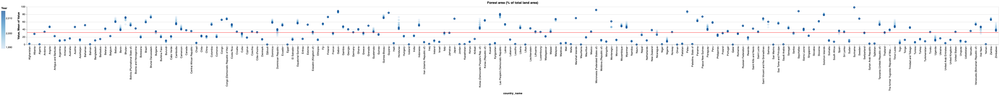

In [69]:
point = alt.Chart(Forest_df, title="Forest area (% of total land area)").mark_point().encode(
    x='country_name',
    y='Value',
    color=alt.Color('Year', legend=alt.Legend(orient="left")),
    tooltip=['Value', 'Year', 'country_name']
)
rule = alt.Chart(Forest_df).mark_rule(color='red').encode(
    y='mean(Value)'
)

(point + rule).properties(height=150)

Let't see if the is a correlation between the health indicators and forest among all countries   

In [70]:
FA_HIV = pd.merge(Forest_df, HIV[['Value', 'iso3']], on='iso3')
FA_HIV = FA_HIV.drop(['indicator_id'], axis=1)
FA_HIV = FA_HIV.rename(columns={"Value_x": "Value Forest area", "Value_y": "Value HIV"})

In [71]:
FA_LEB = pd.merge(Forest_df, LEB[['Value', 'iso3']], on='iso3')
FA_LEB = FA_LEB.drop(['indicator_id'], axis=1)
FA_LEB = FA_LEB.rename(columns={"Value_x": "Value Forest area", "Value_y": "Value LEB"})

In [72]:
FA_MRF = pd.merge(Forest_df, MRF[['Value', 'iso3']], on='iso3')
FA_MRF = FA_MRF.drop(['indicator_id'], axis=1)
FA_MRF = FA_MRF.rename(columns={"Value_x": "Value Forest area", "Value_y": "Value MRF"})

In [73]:
FA_MRM = pd.merge(Forest_df, MRM[['Value', 'iso3']], on='iso3')
FA_MRM = FA_MRM.drop(['indicator_id'], axis=1)
FA_MRM = FA_MRM.rename(columns={"Value_x": "Value Forest area", "Value_y": "Value MRM"})

In [74]:
FA_MRC = pd.merge(Forest_df, MRC[['Value', 'iso3']], on='iso3')
FA_MRC = FA_MRC.drop(['indicator_id'], axis=1)
FA_MRC = FA_MRC.rename(columns={"Value_x": "Value Forest area", "Value_y": "Value MRC"})

In [75]:
FA_HIV.corr()

,Value Forest area,Value HIV
Value Forest area,1.000000,0.015671
Value HIV,0.015671,1.000000


In [76]:
FA_LEB.corr()

,Value Forest area,Value LEB
Value Forest area,1.000000,0.011592
Value LEB,0.011592,1.000000


In [77]:
FA_MRF.corr()

,Value Forest area,Value MRF
Value Forest area,1.000000,0.031662
Value MRF,0.031662,1.000000


In [78]:
FA_MRM.corr()

,Value Forest area,Value MRM
Value Forest area,1.000000,0.064999
Value MRM,0.064999,1.000000


In [79]:
FA_MRC.corr()

,Value Forest area,Value MRC
Value Forest area,1.000000,-0.042273
Value MRC,-0.042273,1.000000


There is no correlation if we look at all countries at ones so I will take a closer look at countries that have worse than avarage health situation, maybe they will show a positive correlation.

In [80]:
FA_HIVmean = pd.merge(Forest_df, HIVmean[['Value', 'iso3']], on='iso3')
FA_HIVmean = FA_HIVmean.drop(['indicator_id'], axis=1)
FA_HIVmean = FA_HIVmean.rename(columns={"Value_x": "Value Forest area", "Value_y": "Value HIVmean"})

In [81]:
FA_LEBmean = pd.merge(Forest_df, LEBmean[['Value', 'iso3']], on='iso3')
FA_LEBmean = FA_LEBmean.drop(['indicator_id'], axis=1)
FA_LEBmean = FA_LEBmean.rename(columns={"Value_x": "Value Forest area", "Value_y": "Value LEBmean"})

In [82]:
FA_MRFmean = pd.merge(Forest_df, MRFmean[['Value', 'iso3']], on='iso3')
FA_MRFmean = FA_MRFmean.drop(['indicator_id'], axis=1)
FA_MRFmean = FA_MRFmean.rename(columns={"Value_x": "Value Forest area", "Value_y": "Value MRFmean"})

In [83]:
FA_MRMmean = pd.merge(Forest_df, MRMmean[['Value', 'iso3']], on='iso3')
FA_MRMmean = FA_MRMmean.drop(['indicator_id'], axis=1)
FA_MRMmean = FA_MRMmean.rename(columns={"Value_x": "Value Forest area", "Value_y": "Value MRMmean"})

In [84]:
FA_MRCmean = pd.merge(Forest_df, MRCmean[['Value', 'iso3']], on='iso3')
FA_MRCmean = FA_MRCmean.drop(['indicator_id'], axis=1)
FA_MRCmean = FA_MRCmean.rename(columns={"Value_x": "Value Forest area", "Value_y": "Value MRCmean"})

In [85]:
FA_HIVmean.corr()

,Value Forest area,Value HIVmean
Value Forest area,1.000000,-0.146395
Value HIVmean,-0.146395,1.000000


In [86]:
FA_LEBmean.corr()

,Value Forest area,Value LEBmean
Value Forest area,1.000000,0.052523
Value LEBmean,0.052523,1.000000


In [87]:
FA_MRFmean.corr()

,Value Forest area,Value MRFmean
Value Forest area,1.000000,-0.084074
Value MRFmean,-0.084074,1.000000


In [88]:
FA_MRMmean.corr()

,Value Forest area,Value MRMmean
Value Forest area,1.000000,-0.076395
Value MRMmean,-0.076395,1.000000


In [89]:
FA_MRCmean.corr()

,Value Forest area,Value MRCmean
Value Forest area,1.000000,-0.006833
Value MRCmean,-0.006833,1.000000


<h4>Conclusion: There is no positive correlation between deforestation and choosen health indicators.</h4>

## Hypothesis 4
<p>h0: There is no correlation between migration rate and unemployment or inequality in income in a country. </p>
<p>h1: The migration rate positively correlates with a lack of unemployment and inequality in income.</p>

In [90]:
df[df['dimension'] == 'Work, employment and vulnerability']['indicator_name'].value_counts()

Employment to population ratio (% ages 15 and older)                  5040
Labour force participation rate (% ages 15 and older), male           5040
Unemployment, total (% of labour force)                               5040
Labour force participation rate (% ages 15 and older), female         5040
Unemployment, youth (% ages 15–24)                                    5040
Employment in services (% of total employment)                        5040
Vulnerable employment (% of total employment)                         5040
Labour force participation rate (% ages 15 and older)                 5040
Employment in agriculture (% of total employment)                     5040
Old-age pension recipients (% of statutory pension age population)    4900
Youth not in school or employment (% ages 15-24)                      3696
Child labour (% ages 5-17)                                            2016
Name: indicator_name, dtype: int64

In [91]:
Unemployment_df = df[df['indicator_name'] == 'Unemployment, total (% of labour force)']

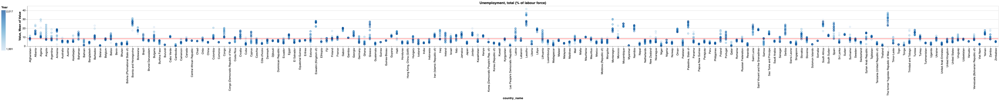

In [92]:
point = alt.Chart(Unemployment_df, title="Unemployment, total (% of labour force)").mark_point().encode(
    x='country_name',
    y='Value',
    color=alt.Color('Year', legend=alt.Legend(orient="left")),
    tooltip=['Value', 'Year', 'country_name']
)

rule = alt.Chart(Unemployment_df).mark_rule(color='red').encode(
    y='mean(Value)'
)

(point + rule).properties(height=150)

Taking countries with higher than average unemployment raiting based on the graph

In [93]:
Unemployment_mean = Unemployment_df[Unemployment_df['Value'] > Unemployment_df['Value'].mean()]

In [94]:
df[df['dimension'] == 'Inequality']['indicator_name'].value_counts()

Inequality in life expectancy (%)            5180
Inequality-adjusted life expectancy index    5180
Inequality in education (%)                  4984
Inequality-adjusted education index          4928
Inequality in income (%)                     4704
Inequality-adjusted income index             4704
Inequality-adjusted HDI (IHDI)               4592
Overall loss in HDI due to inequality (%)    4592
Coefficient of human inequality              4592
Income inequality, Palma ratio               4312
Income inequality, quintile ratio            4312
Income inequality, Gini coefficient          4312
Name: indicator_name, dtype: int64

In [95]:
Inequality_df = df[df['indicator_name'] == 'Inequality in income (%)']

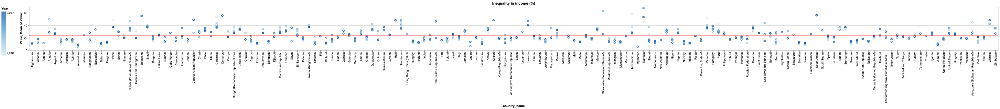

In [96]:
point = alt.Chart(Inequality_df, title="Inequality in income (%)").mark_point().encode(
    x='country_name',
    y='Value',
    color=alt.Color('Year', legend=alt.Legend(orient="left")),
    tooltip=['Value', 'Year', 'country_name']
)

rule = alt.Chart(Inequality_df).mark_rule(color='red').encode(
    y='mean(Value)'
)

(point + rule).properties(height=150)

Taking countries with higher than average inequality raiting based on the graph

In [97]:
Inequality_mean = Inequality_df[Inequality_df['Value'] > Inequality_df['Value'].mean()]

In [98]:
df[df['dimension'] == 'Mobility and communication']['indicator_name'].value_counts()

Mobile phone subscriptions (per 100 people)                       5404
Internet users, total (% of population)                           5376
International inbound tourists (thousands)                        5264
Net migration rate (per 1,000 people)                             5180
International student mobility (% of total tertiary enrolment)    4340
Internet users, female (% of female population)                   2436
Name: indicator_name, dtype: int64

In [99]:
Migration_df = df[df['indicator_name'] == 'Net migration rate (per 1,000 people)']

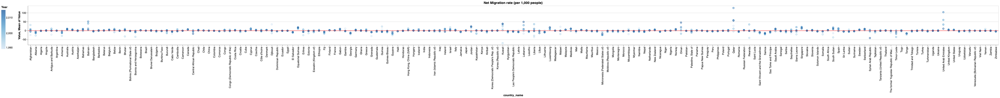

In [100]:
point = alt.Chart(Migration_df, title="Net Migration rate (per 1,000 people)").mark_point().encode(
    x='country_name',
    y='Value',
    color=alt.Color('Year', legend=alt.Legend(orient="left")),
    tooltip=['Value', 'Year', 'country_name']
)
rule = alt.Chart(Migration_df).mark_rule(color='red').encode(
    y='mean(Value)'
)

(point + rule).properties(height=150)

In [101]:
Migration_employment = pd.merge(Migration_df, Unemployment_mean[['Value', 'iso3']], on='iso3')
Migration_employment = Migration_employment.drop(['indicator_id'], axis=1)
Migration_employment = Migration_employment.rename(columns={"Value_x": "Value migration rate", "Value_y": "Value unemployment"})

In [102]:
Migration_inequality = pd.merge(Migration_df, Inequality_df[['Value', 'iso3']], on='iso3')
Migration_inequality = Migration_inequality.drop(['indicator_id'], axis=1)
Migration_inequality = Migration_inequality.rename(columns={"Value_x": "Value migration rate", "Value_y": "Value inequality"})

In [103]:
Migration_employment.corr()

,Value migration rate,Value unemployment
Value migration rate,1.000000,-0.063817
Value unemployment,-0.063817,1.000000


In [104]:
Migration_inequality.corr()

,Value migration rate,Value inequality
Value migration rate,1.000000,-0.082028
Value inequality,-0.082028,1.000000


In [105]:
Migration_employment_mean = pd.merge(Migration_df, Unemployment_mean[['Value', 'iso3']], on='iso3')
Migration_employment_mean = Migration_employment_mean.drop(['indicator_id'], axis=1)
Migration_employment_mean = Migration_employment_mean.rename(columns={"Value_x": "Value migration rate", "Value_y": "Value unemployment mean"})

In [106]:
Migration_employment_mean.corr()

,Value migration rate,Value unemployment mean
Value migration rate,1.000000,-0.063817
Value unemployment mean,-0.063817,1.000000


In [107]:
Migration_inequality_mean = pd.merge(Migration_df, Inequality_mean[['Value', 'iso3']], on='iso3')
Migration_inequality_mean = Migration_inequality_mean.drop(['indicator_id'], axis=1)
Migration_inequality_mean = Migration_inequality_mean.rename(columns={"Value_x": "Value migration rate", "Value_y": "Value inequality mean"})

In [108]:
Migration_inequality_mean.corr()

,Value migration rate,Value inequality mean
Value migration rate,1.000000,0.009058
Value inequality mean,0.009058,1.000000


<h4>Conclusion: based on the data I have there is no correlation between migration rate and unemployment or inequality in income in a country.</h4>